# Data Drift Analysis — The Big Short MLOps Project

**Objective**: compare the distribution of features used to train the model (2000-2002)
against the distribution of inference data (2007), using Evidently.

**Why this matters**: the model was trained on loans from a stable market period.
By 2007, the market had changed dramatically — different loan profiles, higher risk.
If drift is detected, it means the model is being applied to data it was never
designed for, which explains the performance degradation we already measured.

**Reference**: train features (2000-2002) → what the model learned from  
**Current**: inference features (2007) → what arrives in production

In [1]:
import warnings
warnings.filterwarnings('ignore')

import json
import pandas as pd
import numpy as np
import plotly.offline as py
import plotly.graph_objs as go
import matplotlib.pyplot as plt

from evidently import ColumnMapping
from evidently.report import Report
from evidently.metric_preset import DataDriftPreset
from evidently.metrics import (
    DatasetDriftMetric,
    ColumnDriftMetric,
    ColumnSummaryMetric,
)

py.init_notebook_mode()

## 1. Load reference (train) and current (inference) data

In [2]:
# Reference: features used to train the model (2000-2002)
features_train = pd.read_parquet('../data/04_feature/features_train.parquet')

# Current: features from inference data (2007, raw origination only)
features_inference = pd.read_parquet('../data/04_feature/features_inference.parquet')

# Load metadata to know which columns are features
with open('../data/08_reporting/train_metadata.json') as f:
    train_metadata = json.load(f)

feature_columns = train_metadata['feature_columns']
target_col = train_metadata['target_column']  # 'default'
id_col = train_metadata['id_column']           # 'loan_sequence_number'

print(f'Reference (train) shape: {features_train.shape}')
print(f'Current (inference) shape: {features_inference.shape}')
print(f'Number of features: {len(feature_columns)}')

Reference (train) shape: (119999, 25)
Current (inference) shape: (50000, 25)
Number of features: 24


In [3]:
# Prepare clean DataFrames — drop target and ID, keep only feature columns
# Convert nullable types (Int64) to float64 for Evidently compatibility

def prepare_for_evidently(df, feature_columns, target_col, id_col):
    df = df.drop(columns=[target_col, id_col], errors='ignore')
    df = df.reindex(columns=feature_columns, fill_value=0)
    df = df.apply(pd.to_numeric, errors='coerce').fillna(0).astype('float64')
    return df

reference = prepare_for_evidently(features_train, feature_columns, target_col, id_col)
current = prepare_for_evidently(features_inference, feature_columns, target_col, id_col)

print(f'Reference shape: {reference.shape}')
print(f'Current shape: {current.shape}')
reference.head()

Reference shape: (119999, 24)
Current shape: (50000, 24)


,credit_score,first_time_homebuyer_flag,mi_percentage,number_of_units,occupancy_status,original_cltv,original_dti,original_upb,original_ltv,original_interest_rate,...,property_type,loan_purpose,original_loan_term,number_of_borrowers,interest_only_indicator,first_payment_date_year,first_payment_date_month,maturity_date_year,maturity_date_month,loan_term_months
50000,648.0,0.0,0.0,1.0,1.0,75.0,29.0,128000.0,75.0,8.250,...,4.0,0.0,360.0,2.0,0.0,2000.0,3.0,2030.0,2.0,359.0
50001,693.0,0.0,25.0,1.0,0.0,90.0,19.0,121000.0,90.0,8.750,...,4.0,2.0,360.0,2.0,0.0,2000.0,5.0,2030.0,4.0,359.0
50002,661.0,2.0,30.0,1.0,1.0,95.0,31.0,39000.0,95.0,8.375,...,0.0,2.0,360.0,1.0,0.0,2000.0,5.0,2030.0,4.0,359.0
50003,655.0,2.0,25.0,1.0,1.0,95.0,34.0,95000.0,95.0,8.500,...,4.0,2.0,360.0,1.0,0.0,2000.0,4.0,2030.0,3.0,359.0
50004,747.0,1.0,0.0,1.0,1.0,91.0,34.0,132000.0,91.0,8.500,...,0.0,2.0,180.0,1.0,0.0,2000.0,4.0,2015.0,3.0,179.0


In [4]:
# Define column mapping for Evidently
# Separate numerical from categorical features based on number of unique values

categorical_features = [
    'first_time_homebuyer_flag', 'occupancy_status', 'channel',
    'prepayment_penalty_flag', 'amortization_type', 'property_state',
    'property_type', 'loan_purpose', 'interest_only_indicator',
]

# Only include columns that exist in the actual feature set
cat_cols = [c for c in categorical_features if c in feature_columns]
num_cols = [c for c in feature_columns if c not in cat_cols]

column_mapping = ColumnMapping()
column_mapping.numerical_features = num_cols
column_mapping.categorical_features = cat_cols

print(f'Numerical features: {num_cols}')
print(f'Categorical features: {cat_cols}')

Numerical features: ['credit_score', 'mi_percentage', 'number_of_units', 'original_cltv', 'original_dti', 'original_upb', 'original_ltv', 'original_interest_rate', 'original_loan_term', 'number_of_borrowers', 'first_payment_date_year', 'first_payment_date_month', 'maturity_date_year', 'maturity_date_month', 'loan_term_months']
Categorical features: ['first_time_homebuyer_flag', 'occupancy_status', 'channel', 'prepayment_penalty_flag', 'amortization_type', 'property_state', 'property_type', 'loan_purpose', 'interest_only_indicator']


## 2. Full Dataset Drift Report (Evidently)

Compares every feature between reference (train 2000-2002) and current (inference 2007).
Evidently automatically selects the appropriate statistical test per feature type:
- Numerical features → Kolmogorov-Smirnov test (default)
- Categorical features → chi-squared test (default)

In [5]:
# Full interactive Evidently report
data_drift_report = Report(metrics=[DataDriftPreset()])
data_drift_report.run(
    reference_data=reference,
    current_data=current,
    column_mapping=column_mapping,
)
data_drift_report

## 3. Extract drift metrics programmatically

The interactive report above is great visually, but for the pipeline we need
the underlying numbers — which features drifted, what are the p-values, etc.

In [6]:
report_dict = data_drift_report.as_dict()

# Dataset-level summary
dataset_metrics = report_dict['metrics'][0]['result']
print(f"Dataset drift detected: {dataset_metrics['dataset_drift']}")
print(f"Share of drifted features: {dataset_metrics['drift_share']:.2%}")
print(f"Number of drifted features: {dataset_metrics['number_of_drifted_columns']} / {dataset_metrics['number_of_columns']}")

Dataset drift detected: True
Share of drifted features: 50.00%
Number of drifted features: 14 / 24


In [7]:
# Per-feature drift details
drift_by_columns = report_dict['metrics'][1]['result']['drift_by_columns']

drift_rows = []
for feature, details in drift_by_columns.items():
    drift_rows.append({
        'feature': feature,
        'drift_detected': details['drift_detected'],
        'drift_score': details['drift_score'],
        'stattest_name': details.get('stattest_name', 'N/A'),
        'threshold': details.get('threshold', 'N/A'),
    })

drift_df = pd.DataFrame(drift_rows).sort_values('drift_score', ascending=True)
print(drift_df.to_string(index=False))

                  feature  drift_detected  drift_score                 stattest_name threshold
  interest_only_indicator           False     0.005098       Jensen-Shannon distance       N/A
      number_of_borrowers           False     0.010615       Jensen-Shannon distance       N/A
          number_of_units           False     0.011808       Jensen-Shannon distance       N/A
                  channel           False     0.017058       Jensen-Shannon distance       N/A
 first_payment_date_month           False     0.020465 Wasserstein distance (normed)       N/A
      maturity_date_month           False     0.036555 Wasserstein distance (normed)       N/A
  prepayment_penalty_flag           False     0.037327       Jensen-Shannon distance       N/A
            property_type           False     0.051086       Jensen-Shannon distance       N/A
first_time_homebuyer_flag           False     0.074503       Jensen-Shannon distance       N/A
         occupancy_status           False     0.07

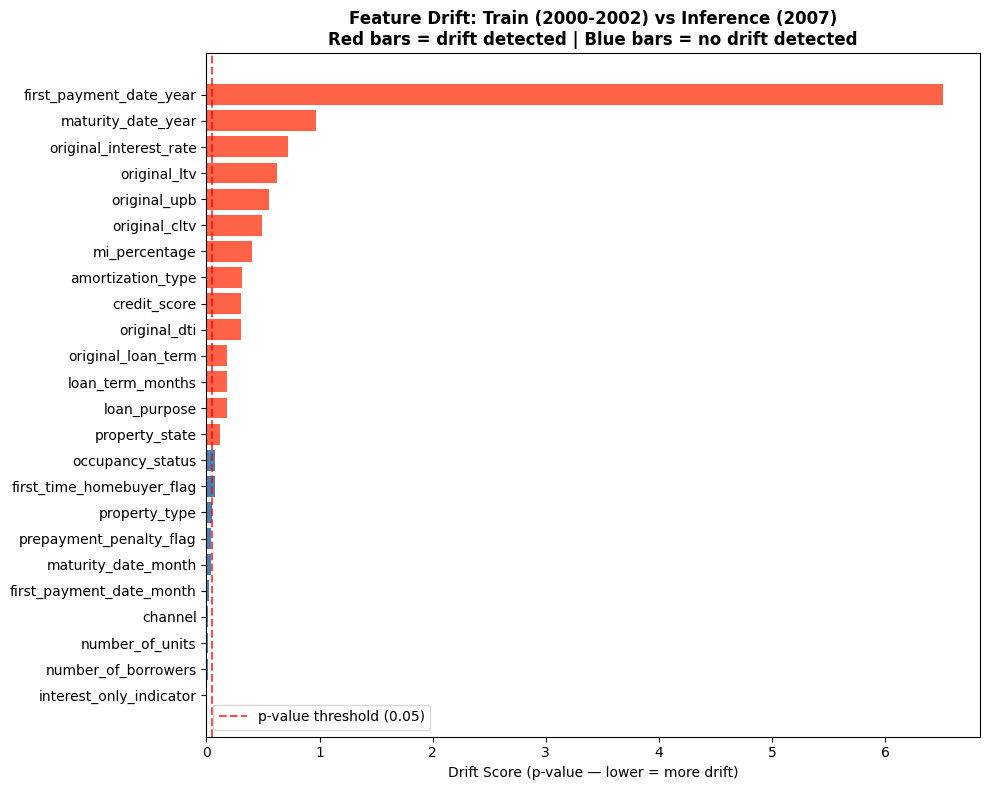

In [8]:
# Visualize — horizontal bar chart of drift scores per feature
fig, ax = plt.subplots(figsize=(10, 8))

colors = ['tomato' if drifted else 'steelblue'
          for drifted in drift_df['drift_detected']]

ax.barh(drift_df['feature'], drift_df['drift_score'], color=colors)
ax.axvline(0.05, color='red', linestyle='--', alpha=0.7, label='p-value threshold (0.05)')
ax.set_xlabel('Drift Score (p-value — lower = more drift)')
ax.set_title('Feature Drift: Train (2000-2002) vs Inference (2007)\n'
             'Red bars = drift detected | Blue bars = no drift detected',
             fontweight='bold')
ax.legend()
plt.tight_layout()
plt.show()

## 4. Year-by-Year Drift Evolution (2003-2008)

This is the most powerful analysis for the Big Short narrative: compare the
reference (train 2000-2002) against each year separately, to see when drift
started to appear and how it progressed towards the 2008 crisis.

In [9]:
# Load the full cleaned dataset to slice by year
full_data = pd.read_parquet('../data/03_primary/model_input_cleaned.parquet')

import sys
sys.path.insert(0, '../src')
import pickle
from mortgage_default.pipelines.model_train.nodes import (
    drop_unused_columns, engineer_date_features, apply_feature_transformers
)

with open('../data/04_feature/feature_transformers.pkl', 'rb') as f:
    feature_transformers = pickle.load(f)

def get_year_features(year):
    df = full_data[full_data['year'] == year].drop(columns=['year']).copy()
    df = drop_unused_columns(df)
    df = engineer_date_features(df)
    df = apply_feature_transformers(df, feature_transformers)
    df = df.drop(columns=[target_col, id_col], errors='ignore')
    df = df.reindex(columns=feature_columns, fill_value=0)
    df = df.apply(pd.to_numeric, errors='coerce').fillna(0).astype('float64')
    return df

print('Functions ready — will process each year on demand')

Functions ready — will process each year on demand


In [11]:
def detect_dataset_drift(reference_data, current_data, column_mapping, get_ratio=False):
    report = Report(metrics=[DataDriftPreset()])
    report.run(
        reference_data=reference_data,
        current_data=current_data,
        column_mapping=column_mapping,
    )
    result = report.as_dict()
    if get_ratio:
        return result['metrics'][0]['result']['drift_share']
    return result['metrics'][0]['result']['dataset_drift']


def detect_features_drift(reference_data, current_data, column_mapping, get_scores=False):
    report = Report(metrics=[DataDriftPreset()])
    report.run(
        reference_data=reference_data,
        current_data=current_data,
        column_mapping=column_mapping,
    )
    result = report.as_dict()
    drift_by_columns = result['metrics'][1]['result']['drift_by_columns']

    drifts = []
    all_features = num_cols + cat_cols
    for feature in all_features:
        if feature not in drift_by_columns:
            continue
        if get_scores:
            drifts.append((feature, drift_by_columns[feature]['drift_score']))
        else:
            drifts.append((feature, drift_by_columns[feature]['drift_detected']))
    return drifts

In [12]:
test_years = [2003, 2004, 2005, 2006, 2007, 2008]

# Dataset-level drift ratio per year
drift_ratios = []

drift_detected = []

for year in test_years:
    current_year = get_year_features(year)
    ratio = detect_dataset_drift(reference, current_year, column_mapping, get_ratio=True)
    detected = detect_dataset_drift(reference, current_year, column_mapping, get_ratio=False)
    drift_ratios.append(ratio)
    drift_detected.append(detected)
    print(f'{year}: drift_share={ratio:.2%}, dataset_drift={detected}')

2003: drift_share=50.00%, dataset_drift=True
2004: drift_share=50.00%, dataset_drift=True
2005: drift_share=50.00%, dataset_drift=True
2006: drift_share=50.00%, dataset_drift=True
2007: drift_share=50.00%, dataset_drift=True
2008: drift_share=50.00%, dataset_drift=True


In [13]:
# Heatmap: dataset drift ratio over time 
fig = go.Figure(data=go.Heatmap(
    z=[drift_ratios],
    x=[str(y) for y in test_years],
    y=['Drift Share'],
    hoverongaps=False,
    xgap=1, ygap=1,
    zmin=0, zmax=1,
    colorscale='reds',
))
fig.update_xaxes(side='top')
fig.update_layout(
    title='Dataset Drift Share per Year (Reference: 2000-2002)',
    xaxis_title='Year',
    yaxis_title='',
)
fig.show()

In [14]:
# Feature-level drift per year (boolean heatmap)
features_historical_drift = []

for year in test_years:
    current_year = get_year_features(year)
    drifts = detect_features_drift(reference, current_year, column_mapping, get_scores=False)
    features_historical_drift.append([x[1] for x in drifts])

feature_names = [x[0] for x in drifts]
drift_frame = pd.DataFrame(features_historical_drift, columns=feature_names, index=test_years)
print(drift_frame)

      credit_score  mi_percentage  number_of_units  original_cltv  \
2003          True           True            False           True   
2004          True           True            False           True   
2005          True           True            False           True   
2006          True           True            False           True   
2007          True           True            False           True   
2008          True           True            False           True   

      original_dti  original_upb  original_ltv  original_interest_rate  \
2003          True          True          True                    True   
2004         False          True          True                    True   
2005          True          True          True                    True   
2006          True          True          True                    True   
2007          True          True          True                    True   
2008          True          True          True                    True  

In [15]:
# Feature drift heatmap over time (professor's style)
fig = go.Figure(data=go.Heatmap(
    z=drift_frame.astype(int).transpose().values,
    x=[str(y) for y in test_years],
    y=feature_names,
    hoverongaps=False,
    xgap=1, ygap=1,
    zmin=0, zmax=1,
    showscale=False,
    colorscale='Bluered',
))
fig.update_xaxes(side='top')
fig.update_layout(
    title='Feature Drift per Year (Reference: 2000-2002)<br>Red = drift detected, Blue = no drift',
    xaxis_title='Year',
    yaxis_title='Feature',
    height=600,
)
fig.show()

In [16]:
# p-value heatmap (drift score) — shows how confidence in drift grows over time
features_pvalues = []

for year in test_years:
    current_year = get_year_features(year)
    drifts = detect_features_drift(reference, current_year, column_mapping, get_scores=True)
    features_pvalues.append([x[1] for x in drifts])

pvalue_frame = pd.DataFrame(features_pvalues, columns=feature_names, index=test_years)

fig = go.Figure(data=go.Heatmap(
    z=pvalue_frame.transpose().values,
    x=[str(y) for y in test_years],
    y=feature_names,
    hoverongaps=False,
    xgap=1, ygap=1,
    zmin=0, zmax=1,
    colorscale='reds_r',
))
fig.update_xaxes(side='top')
fig.update_layout(
    title='p-value per Feature per Year (lower = stronger drift signal)',
    xaxis_title='Year',
    yaxis_title='Feature',
    height=600,
)
fig.show()

## 5. Detailed analysis of the most drifted features

Zoom in on the top drifted features from the train vs 2007 comparison.

In [17]:
# Identify top 3 drifted features from the main comparison
top_drifted = drift_df[drift_df['drift_detected'] == True].head(3)['feature'].tolist()
print(f'Top drifted features: {top_drifted}')

# Detailed report with ColumnSummaryMetric for each
detailed_metrics = [DatasetDriftMetric()]
for feature in top_drifted:
    detailed_metrics.append(ColumnDriftMetric(column_name=feature))
    detailed_metrics.append(ColumnSummaryMetric(column_name=feature))

detailed_report = Report(metrics=detailed_metrics)
detailed_report.run(
    reference_data=reference,
    current_data=current,
    column_mapping=column_mapping,
)
detailed_report

Top drifted features: ['property_state', 'loan_purpose', 'loan_term_months']


## 6. Summary for the Report

In [18]:
print('=== Data Drift Summary ===')
print(f'Reference: train data 2000-2002 ({len(reference):,} loans)')
print(f'Current:   inference data 2007 ({len(current):,} loans)')
print()
print(f'Dataset drift detected: {dataset_metrics["dataset_drift"]}')
print(f'Share of drifted features: {dataset_metrics["drift_share"]:.2%}')
print(f'Drifted features: {dataset_metrics["number_of_drifted_columns"]} out of {dataset_metrics["number_of_columns"]}')
print()
print('Top drifted features (lowest p-value):')
print(drift_df[drift_df['drift_detected']==True][['feature','drift_score','stattest_name']].head(5).to_string(index=False))
print()
print('Drift share by year:')
for year, ratio, detected in zip(test_years, drift_ratios, drift_detected):
    print(f'  {year}: {ratio:.2%} features drifted (dataset_drift={detected})')

=== Data Drift Summary ===
Reference: train data 2000-2002 (119,999 loans)
Current:   inference data 2007 (50,000 loans)

Dataset drift detected: True
Share of drifted features: 50.00%
Drifted features: 14 out of 24

Top drifted features (lowest p-value):
           feature  drift_score                 stattest_name
    property_state     0.119247       Jensen-Shannon distance
      loan_purpose     0.177963       Jensen-Shannon distance
  loan_term_months     0.180776 Wasserstein distance (normed)
original_loan_term     0.180776 Wasserstein distance (normed)
      original_dti     0.304570 Wasserstein distance (normed)

Drift share by year:
  2003: 50.00% features drifted (dataset_drift=True)
  2004: 50.00% features drifted (dataset_drift=True)
  2005: 50.00% features drifted (dataset_drift=True)
  2006: 50.00% features drifted (dataset_drift=True)
  2007: 50.00% features drifted (dataset_drift=True)
  2008: 50.00% features drifted (dataset_drift=True)


## Drift Pipeline Output

In [4]:
with open('../data/08_reporting/data_drift_metrics.json') as f:
    metrics = json.load(f)

print("=== Data Drift Summary ===")
print(f"Reference: {metrics['reference_label']} ({metrics['n_reference_rows']:,} loans)")
print(f"Features excluded from drift: {metrics['features_excluded_from_drift']}")
print()
print("=== Drift por ano ===")
for summary in metrics['yearly_summary']:
    print(f"{summary['year']}: {summary['n_drifted_features']}/{summary['n_features']} features drifted "
          f"({summary['drift_share']:.0%}) — dataset_drift={summary['dataset_drift_detected']} "
          f"| {summary['n_loans']:,} loans")

print()

# Tabela por feature x ano
drift_report = pd.read_csv('../data/08_reporting/data_drift_feature_report.csv')
print("=== Drift por feature x ano ===")

# Pivot: features nas linhas, anos nas colunas
pivot = drift_report.pivot_table(
    index='feature', columns='year', values='drift_detected', aggfunc='first'
)
print(pivot.to_string())

print()

# Features com drift mais consistente ao longo dos anos
drift_report['drift_detected'] = drift_report['drift_detected'].astype(int)
consistency = drift_report.groupby('feature')['drift_detected'].sum().sort_values(ascending=False)
print("=== Features com drift mais consistente (nº de anos com drift) ===")
print(consistency.to_string())

=== Data Drift Summary ===
Reference: train_2000_2002 (119,999 loans)
Features excluded from drift: ['first_payment_date_year', 'first_payment_date_month', 'maturity_date_year', 'maturity_date_month', 'loan_term_months']

=== Drift por ano ===
2003: 10/19 features drifted (50%) — dataset_drift=True | 39,999 loans
2004: 9/19 features drifted (50%) — dataset_drift=False | 40,000 loans
2005: 10/19 features drifted (50%) — dataset_drift=True | 89,998 loans
2006: 13/19 features drifted (50%) — dataset_drift=True | 39,998 loans
2007: 12/19 features drifted (50%) — dataset_drift=True | 40,000 loans

=== Drift por feature x ano ===
year                        2003   2004   2005   2006   2007
feature                                                     
amortization_type           True   True  False   True  False
channel                    False  False  False  False  False
credit_score                True   True   True   True   True
first_time_homebuyer_flag  False  False  False  False  False
in